### Zadania

Lista składa się z dwóch sekcji: pierwsza (zadania 1 i 2) dotyczy metod detekcji krawędzi, druga (zadania 3 i 4) operacji na histogramach.

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.stats import norm


##### Zad. 1: Wyznaczenie gradientów

Wykonaj dla obrazu `coins` sztuczny obraz ilustrujący wielkość (moduł) wektora gradientu w danym punkcie. Do wyświetlenia użyj [mapy kolorów](https://matplotlib.org/stable/tutorials/colors/colormaps.html) `hot` do oznaczenia wielkości gradientu odpowiednim kolorem – im większa wartość, tym bardziej czerwony (_mapa ciepła_).  
Gdzie gradienty są bliskie zera?  
Czy uzyskany wynik pozwoliłby np. na detekcję obiektów?

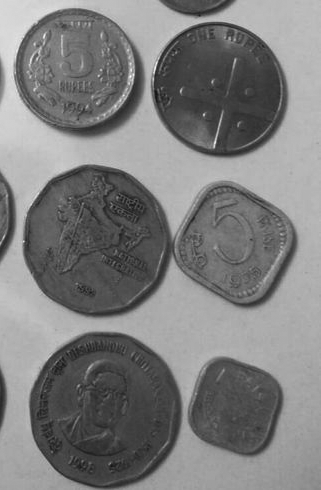

In [2]:
coins = cv2.imread('Monety_szare.bmp', cv2.IMREAD_GRAYSCALE)
Image.fromarray(coins)

Rozwiązanie:

In [3]:
coins.shape

(490, 321)

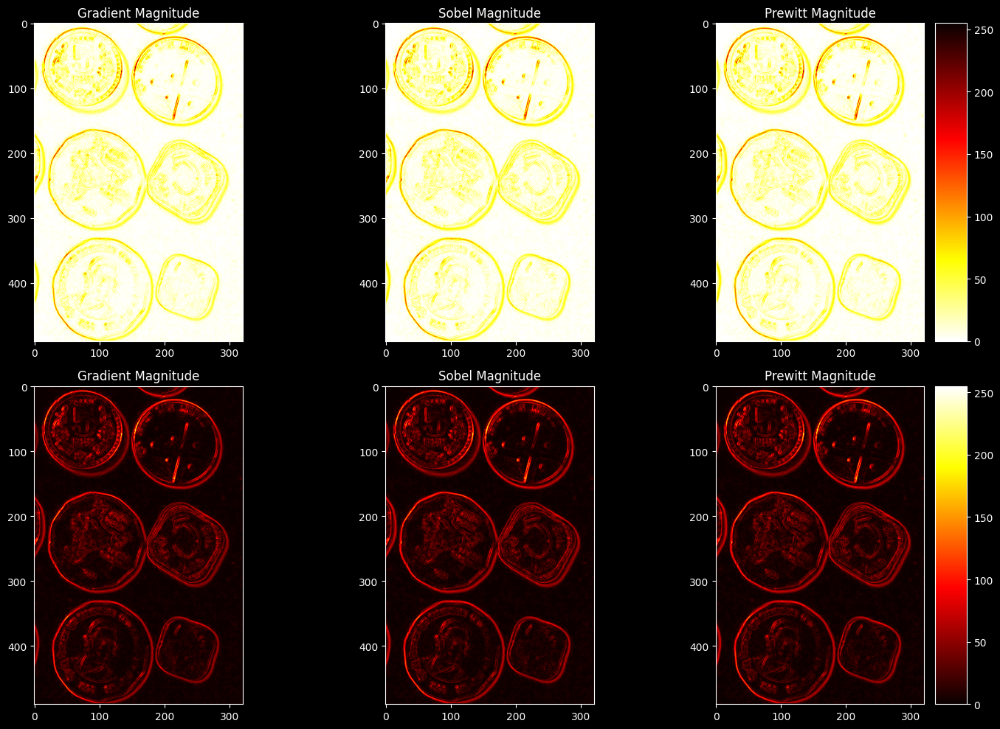

In [4]:
def calculate_gradient(image):
    grad_x = np.zeros_like(image, dtype=np.float64)
    grad_y = np.zeros_like(image, dtype=np.float64)
    
    kernel_x = np.array([[-1, 0, 1]])
    kernel_y = np.array([[-1], [0], [1]])
    
    grad_x = cv2.filter2D(image, cv2.CV_64F, kernel_x)
    grad_y = cv2.filter2D(image, cv2.CV_64F, kernel_y)
    return grad_x, grad_y

grad_x, grad_y = calculate_gradient(coins)
gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
gradient_magnitude = gradient_magnitude / np.max(gradient_magnitude) * 255
gradient_magnitude = np.uint8(gradient_magnitude)

sobel_x = cv2.Sobel(coins, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(coins, cv2.CV_64F, 0, 1, ksize=3)
sobel_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
sobel_magnitude = sobel_magnitude / np.max(sobel_magnitude) * 255
sobel_magnitude = np.uint8(sobel_magnitude)

prewitt_kernel_1 = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
prewitt_kernel_2 = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
prewitt_kernel_3 = np.array([[0, -1, -1], [1, 0, -1], [1, 1, 0]])
prewitt_kernel_4 = np.array([[-1, -1, 0], [-1, 0, 1], [0, 1, 1]])
prewitt_kernel_5 = -prewitt_kernel_1
prewitt_kernel_6 = -prewitt_kernel_2
prewitt_kernel_7 = -prewitt_kernel_3
prewitt_kernel_8 = -prewitt_kernel_4

prewitt_kernels = [prewitt_kernel_1, prewitt_kernel_2, prewitt_kernel_3, prewitt_kernel_4, prewitt_kernel_5, prewitt_kernel_6, prewitt_kernel_7, prewitt_kernel_8]

prewitt_vals = [cv2.filter2D(coins, cv2.CV_64F, kernel) for kernel in prewitt_kernels]

prewitt_magnitude = np.sqrt(sum(prewitt_val**2 for prewitt_val in prewitt_vals))
prewitt_magnitude = prewitt_magnitude / np.max(prewitt_magnitude) * 255
prewitt_magnitude = np.uint8(prewitt_magnitude)


plots = [gradient_magnitude, sobel_magnitude, prewitt_magnitude]
titles = ['Gradient Magnitude', 'Sobel Magnitude', 'Prewitt Magnitude']
color_maps = ['hot_r', 'hot']

fig, axs = plt.subplots(2, 3, figsize=(15, 10))
for row in range(2):  
    for col in range(3):  
        ax = axs[row, col]
        im = ax.imshow(plots[col], cmap=color_maps[row])
        ax.set_title(titles[col])

    divider = make_axes_locatable(axs[row, 2])
    cax = divider.append_axes("right", size="15%", pad=0.15)
    plt.colorbar(im, cax=cax)

plt.tight_layout()
plt.show()

---

##### Zad. 2: Detekcja krawędzi

Przeprowadź z obrazem `coins_noise` takie przekształcenia, aby zmaksymalizować możliwość rozpoznania obiektów. Wykorzystaj [filtr Canny'ego](https://docs.opencv.org/4.x/dd/d1a/group__imgproc__feature.html#ga04723e007ed888ddf11d9ba04e2232de) do detekcji krawędzi; zbadaj jego zachowanie w zależności od wartości progów oraz sposobu redukcji szumu.

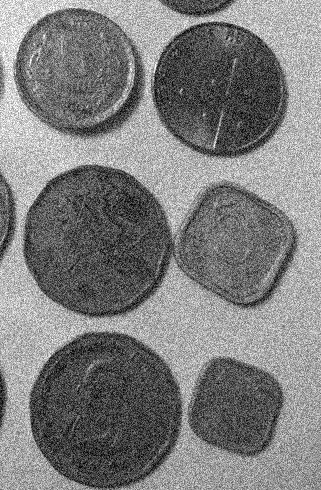

In [5]:
coins_noise = cv2.imread('Monety_szare_szum.bmp', cv2.IMREAD_GRAYSCALE)
Image.fromarray(coins_noise)

Rozwiązanie:

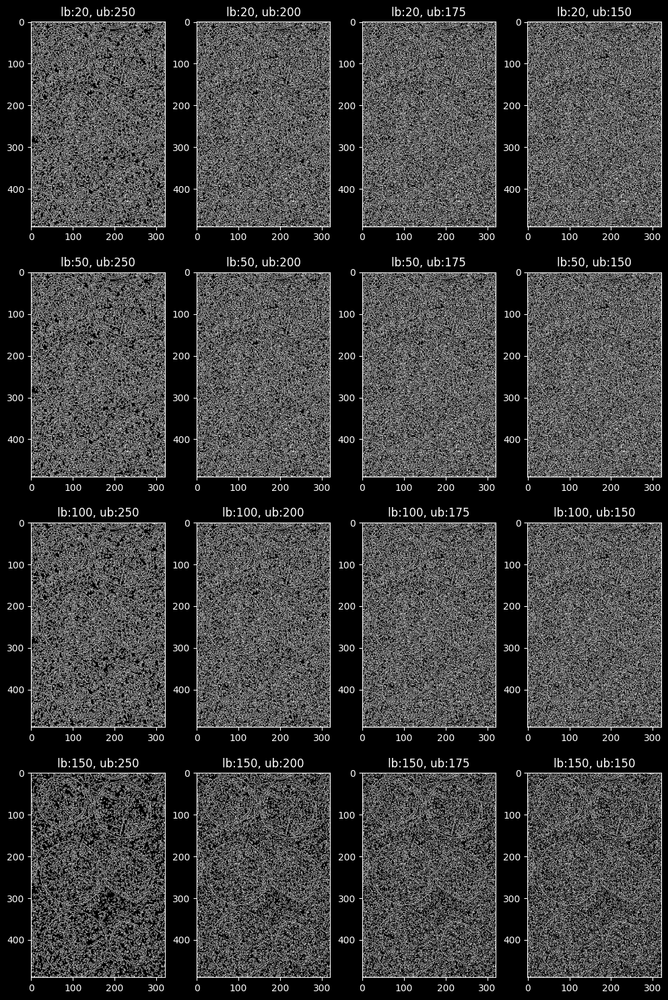

In [6]:
fig, axs = plt.subplots(4, 4, figsize=(10, 15))
# axs = axs.flatten()

lbs = [20, 50, 100, 150]
ubs = [250, 200, 175, 150]

for i in range(len(lbs)):
    for j in range(len(ubs)):
        lb, ub = lbs[i], ubs[j]
        edges = cv2.Canny(coins_noise, lb, ub)
        axs[i, j].imshow(edges, cmap="gray")
        axs[i, j].set_title(f"lb:{lb}, ub:{ub}")
plt.tight_layout()
plt.show()

Nic nie widać, trzeba usunąć szum.

1. Sprawdzenie działania odfiltrowywania szumu w zależności od algorytmu.

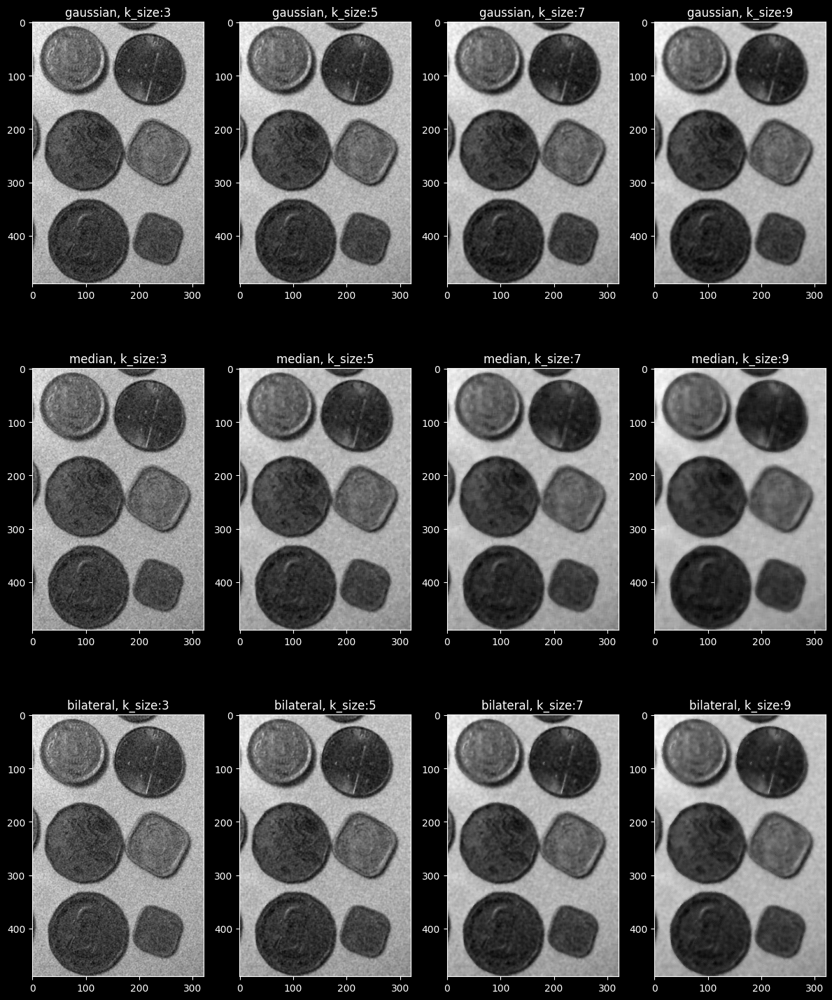

In [7]:
k_sizes = [3, 5, 7, 9]

coins_denoised = {}

methods = ['gaussian', 'median', 'bilateral']
fig, axs = plt.subplots(3, 4, figsize=(12, 15))

for row, method in enumerate(methods):
    coins_denoised[method] = {}
    for col, k_size in enumerate(k_sizes):
        if method == 'gaussian':
            coins_denoised[method][k_size] = cv2.GaussianBlur(coins_noise, (k_size, k_size), 0)
        elif method == 'median':
            coins_denoised[method][k_size] = cv2.medianBlur(coins_noise, k_size)
        elif method == 'bilateral':
            coins_denoised[method][k_size] = cv2.bilateralFilter(coins_noise, k_size, 75, 75)
        axs[row, col].imshow(coins_denoised[method][k_size], cmap="gray")
        axs[row, col].set_title(f"{method}, k_size:{k_size}")
plt.tight_layout()
plt.show()

2. Do dalszych rozważań będziemy wykorzystywać filtry z rozmiarem jądra `k_size=9`

2a.Testowanie alg. Canny'ego dla filtru Gaussa

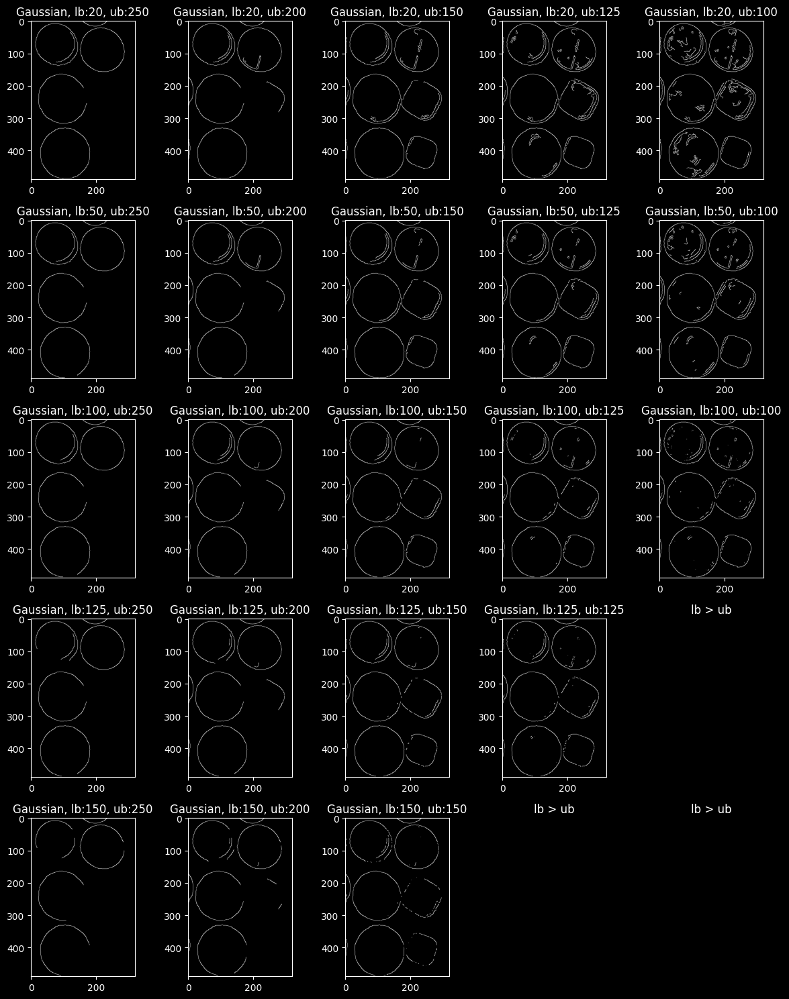

In [8]:
fig, axs = plt.subplots(5, 5, figsize=(12, 15))
# axs = axs.flatten()

lbs = [20, 50, 100, 125, 150]
ubs = [250, 200, 150, 125, 100]

blured_coin = coins_denoised['gaussian'][9]

cannys = {}
for i in range(len(lbs)):
    for j in range(len(ubs)):
        lb, ub = lbs[i], ubs[j]
        if lb > ub:
            axs[i, j].axis('off')
            axs[i, j].set_title(f"lb > ub")
            continue
        edges = cv2.Canny(blured_coin, lb, ub)
        axs[i, j].imshow(edges, cmap="gray")
        axs[i, j].set_title(f"Gaussian, lb:{lb}, ub:{ub}")
        cannys[(lb, ub)] = edges
        
plt.tight_layout()
plt.show()

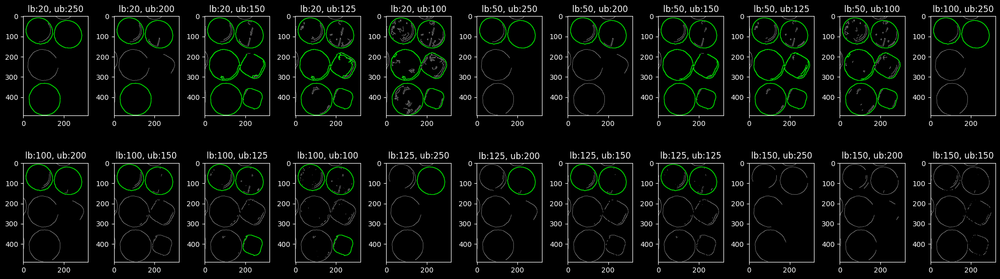

In [9]:
fig, axs = plt.subplots(2, 11, figsize=(20, 6))
axs = axs.flatten()
kernel = np.ones((5,5), np.uint8)
i = 0

gauss_contours = {}

for key, val in cannys.items():
    closed_contours = cv2.morphologyEx(val, cv2.MORPH_CLOSE, kernel)
    final_contours_with_hierarchy, hierarchy = cv2.findContours(closed_contours, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    min_area_threshold = 1000
    filtered_external_contours = [contour for i, contour in enumerate(final_contours_with_hierarchy) 
        if hierarchy[0][i][3] == -1 and cv2.contourArea(contour) > min_area_threshold]
    
    gauss_contours[key] = filtered_external_contours
    contour_image_filtered = cv2.cvtColor(val, cv2.COLOR_GRAY2BGR)
    cv2.drawContours(contour_image_filtered, filtered_external_contours, -1, (0, 255, 0), 2)  
    axs[i].imshow(contour_image_filtered)
    axs[i].set_title(f"lb:{key[0]}, ub:{key[1]}")
    i += 1

plt.tight_layout()
plt.show()


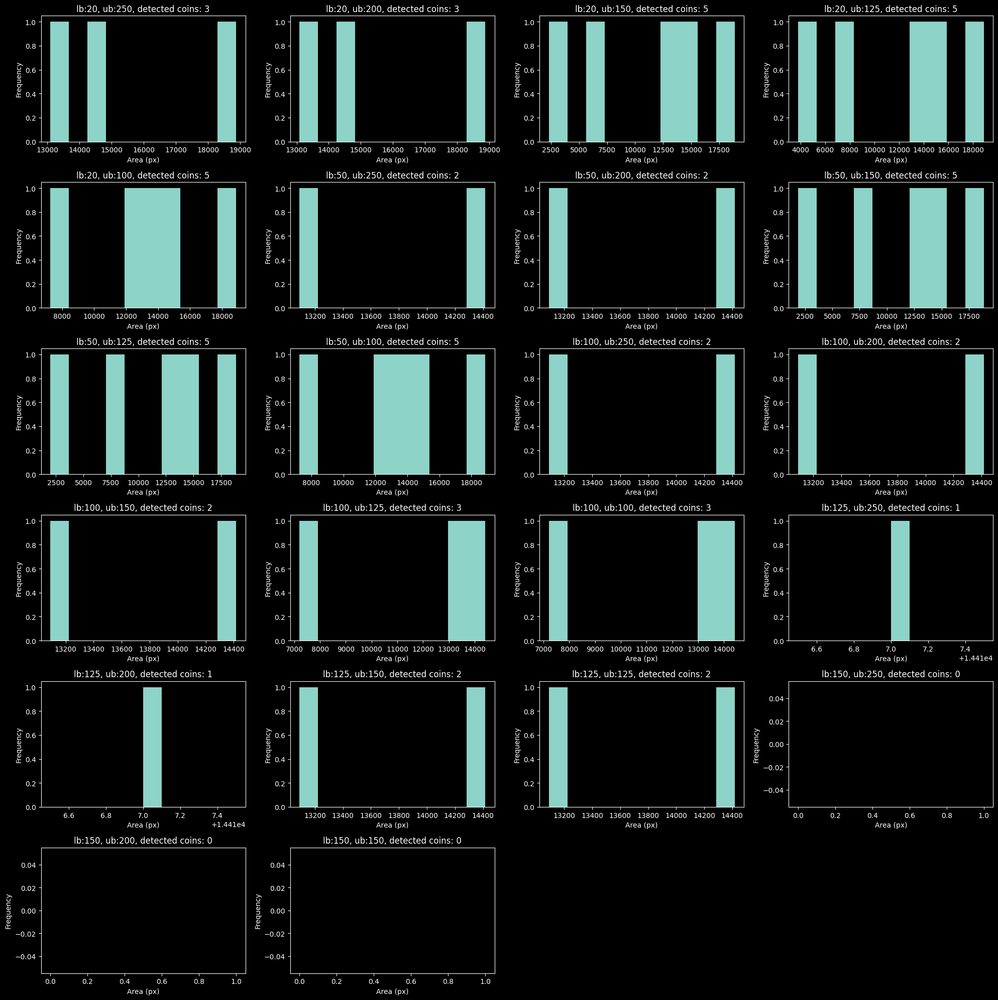

In [10]:
fig, axs_hist = plt.subplots(6, 4, figsize=(20, 20))
axs_hist = axs_hist.flatten()

for i, (key, contours) in enumerate(gauss_contours.items()):
    filtered_contour_areas = [cv2.contourArea(contour) for contour in contours]
    
    axs_hist[i].hist(filtered_contour_areas)
    axs_hist[i].set_title(f"lb:{key[0]}, ub:{key[1]}, detected coins: {len(filtered_contour_areas)}")
    axs_hist[i].set_xlabel("Area (px)")
    axs_hist[i].set_ylabel("Frequency")


for ax in axs_hist[22:]:
    ax.remove()
plt.tight_layout()
plt.show()


Lb:50 UB:125 lub 150

2b. Testowanie dla median filter

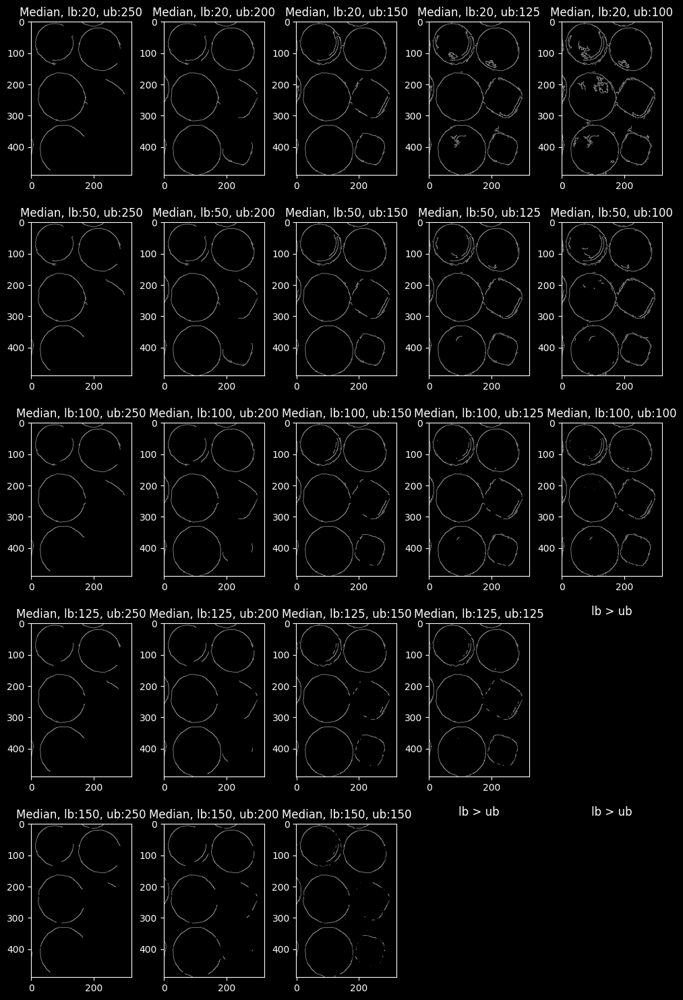

In [11]:
fig, axs = plt.subplots(5, 5, figsize=(10, 15))
# axs = axs.flatten()

lbs = [20, 50, 100, 125, 150]
ubs = [250, 200, 150, 125, 100]

blured_coin = coins_denoised['median'][9]

cannys = {}
for i in range(len(lbs)):
    for j in range(len(ubs)):
        lb, ub = lbs[i], ubs[j]
        if lb > ub:
            axs[i, j].axis('off')
            axs[i, j].set_title(f"lb > ub")
            continue
        edges = cv2.Canny(blured_coin, lb, ub)
        axs[i, j].imshow(edges, cmap="gray")
        axs[i, j].set_title(f"Median, lb:{lb}, ub:{ub}")
        cannys[(lb, ub)] = edges
plt.tight_layout()
plt.show()

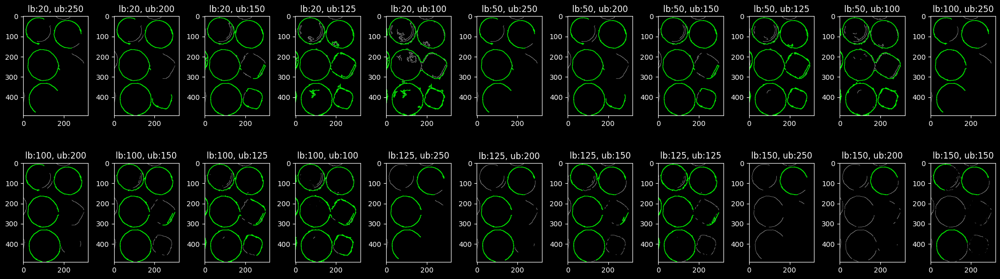

In [12]:
fig, axs = plt.subplots(2, 11, figsize=(20, 6))
axs = axs.flatten()
kernel = np.ones((5,5), np.uint8)
i = 0

median_contours = {}

for key, val in cannys.items():
    closed_contours = cv2.morphologyEx(val, cv2.MORPH_CLOSE, kernel)
    final_contours_with_hierarchy, hierarchy = cv2.findContours(closed_contours, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    min_area_threshold = 100
    filtered_external_contours = [contour for i, contour in enumerate(final_contours_with_hierarchy) 
        if hierarchy[0][i][3] == -1 and cv2.contourArea(contour) > min_area_threshold]
    
    median_contours[key] = filtered_external_contours
    contour_image_filtered = cv2.cvtColor(val, cv2.COLOR_GRAY2BGR)
    cv2.drawContours(contour_image_filtered, filtered_external_contours, -1, (0, 255, 0), 2)  
    axs[i].imshow(contour_image_filtered)
    axs[i].set_title(f"lb:{key[0]}, ub:{key[1]}")
    i += 1

plt.tight_layout()
plt.show()


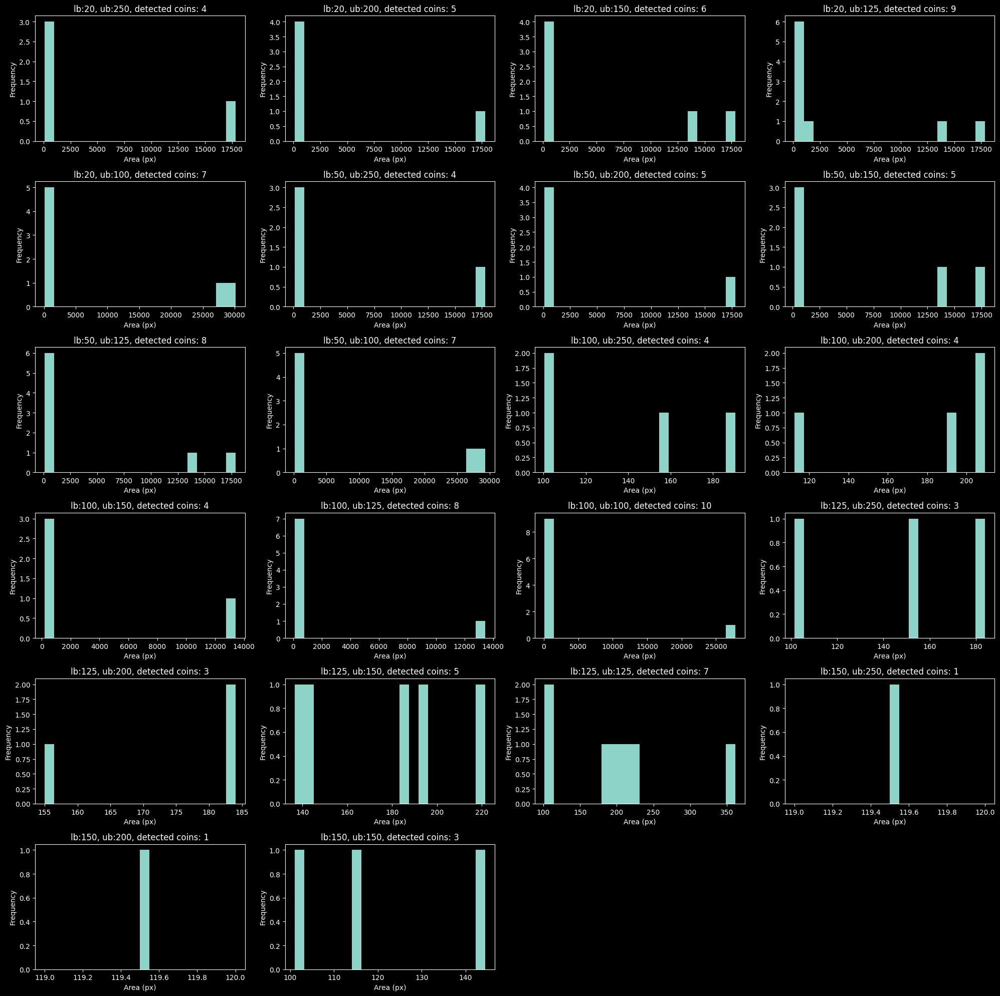

In [13]:
fig, axs_hist = plt.subplots(6, 4, figsize=(20, 20))
axs_hist = axs_hist.flatten()

for i, (key, contours) in enumerate(median_contours.items()):
    filtered_contour_areas = [cv2.contourArea(contour) for contour in contours]
    
    axs_hist[i].hist(filtered_contour_areas, bins=20)
    axs_hist[i].set_title(f"lb:{key[0]}, ub:{key[1]}, detected coins: {len(filtered_contour_areas)}")
    axs_hist[i].set_xlabel("Area (px)")
    axs_hist[i].set_ylabel("Frequency")


for ax in axs_hist[22:]:
    ax.remove()
plt.tight_layout()
plt.show()


LB: 50 UB: 100 lub 125

2c. Testowanie dla bilateral filter

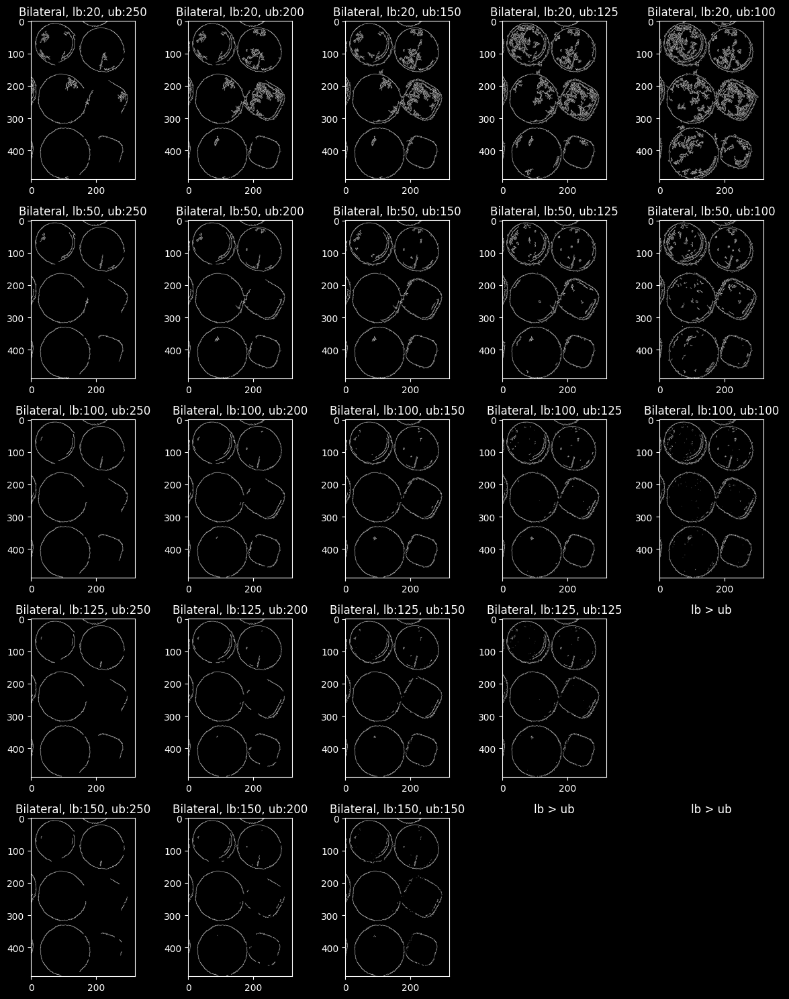

In [14]:
fig, axs = plt.subplots(5, 5, figsize=(12, 15))
# axs = axs.flatten()

lbs = [20, 50, 100, 125, 150]
ubs = [250, 200, 150, 125, 100]

blured_coin = coins_denoised['bilateral'][9]

cannys = {}
for i in range(len(lbs)):
    for j in range(len(ubs)):
        lb, ub = lbs[i], ubs[j]
        if lb > ub:
            axs[i, j].axis('off')
            axs[i, j].set_title(f"lb > ub")
            continue
        edges = cv2.Canny(blured_coin, lb, ub)
        axs[i, j].imshow(edges, cmap="gray")
        axs[i, j].set_title(f"Bilateral, lb:{lb}, ub:{ub}")
        cannys[(lb, ub)] = edges
plt.tight_layout()
plt.show()

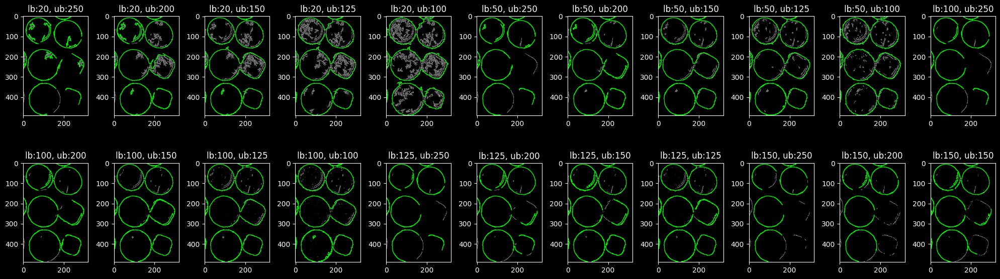

In [15]:
fig, axs = plt.subplots(2, 11, figsize=(20, 6))
axs = axs.flatten()
kernel = np.ones((5,5), np.uint8)
i = 0

bilateral_contours = {}

for key, val in cannys.items():
    closed_contours = cv2.morphologyEx(val, cv2.MORPH_CLOSE, kernel)
    final_contours_with_hierarchy, hierarchy = cv2.findContours(closed_contours, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    min_area_threshold = 100
    filtered_external_contours = [contour for i, contour in enumerate(final_contours_with_hierarchy) 
        if hierarchy[0][i][3] == -1 and cv2.contourArea(contour) > min_area_threshold]
    
    bilateral_contours[key] = filtered_external_contours
    contour_image_filtered = cv2.cvtColor(val, cv2.COLOR_GRAY2BGR)
    cv2.drawContours(contour_image_filtered, filtered_external_contours, -1, (0, 255, 0), 2)  
    axs[i].imshow(contour_image_filtered)
    axs[i].set_title(f"lb:{key[0]}, ub:{key[1]}")
    i += 1

plt.tight_layout()
plt.show()


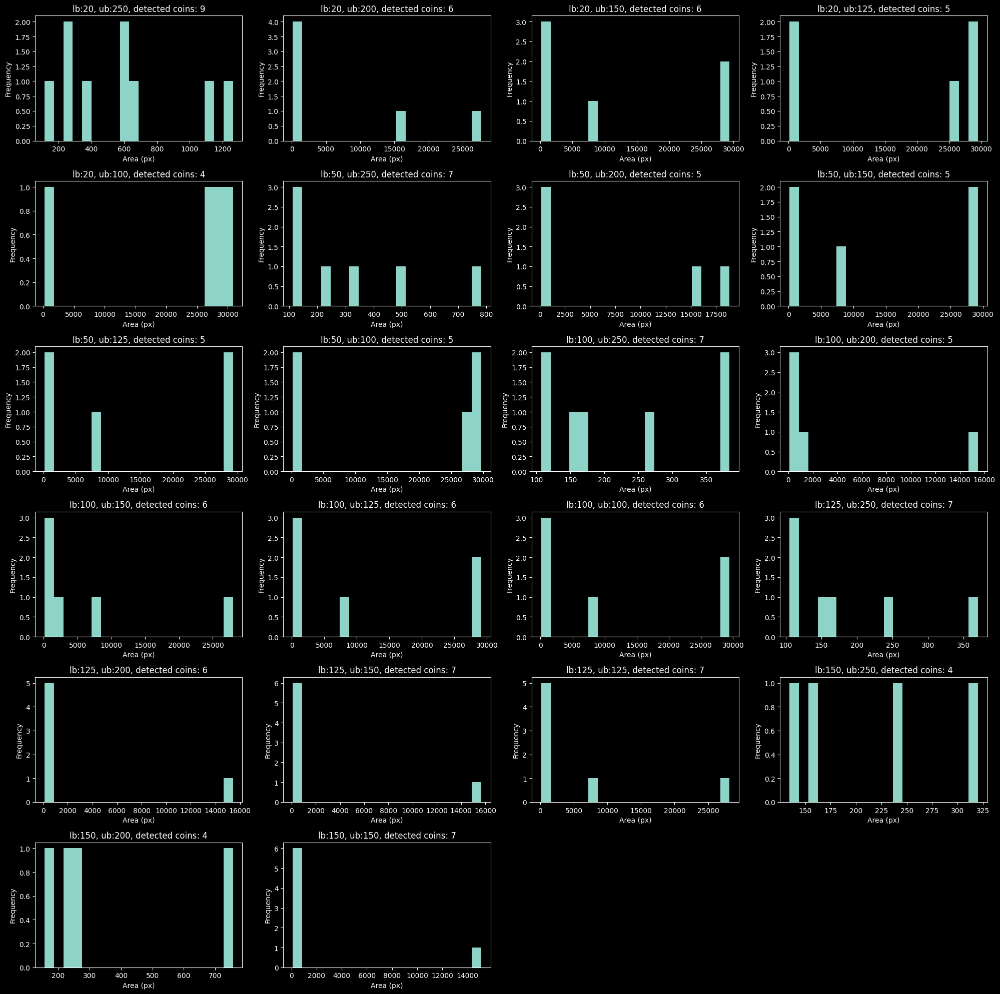

In [16]:
fig, axs_hist = plt.subplots(6, 4, figsize=(20, 20))
axs_hist = axs_hist.flatten()

for i, (key, contours) in enumerate(bilateral_contours.items()):
    filtered_contour_areas = [cv2.contourArea(contour) for contour in contours]
    
    axs_hist[i].hist(filtered_contour_areas, bins=20)
    axs_hist[i].set_title(f"lb:{key[0]}, ub:{key[1]}, detected coins: {len(filtered_contour_areas)}")
    axs_hist[i].set_xlabel("Area (px)")
    axs_hist[i].set_ylabel("Frequency")


for ax in axs_hist[22:]:
    ax.remove()
plt.tight_layout()
plt.show()

---

##### Zad. 3: Wyrównanie histogramu

Wyrównaj histogram obrazu `coins_noise`. Wyniki zaprezentuj za pomocą obrazów i towarzyszących im histogramów. Oceń uzyskaną zmianę w obrazie.

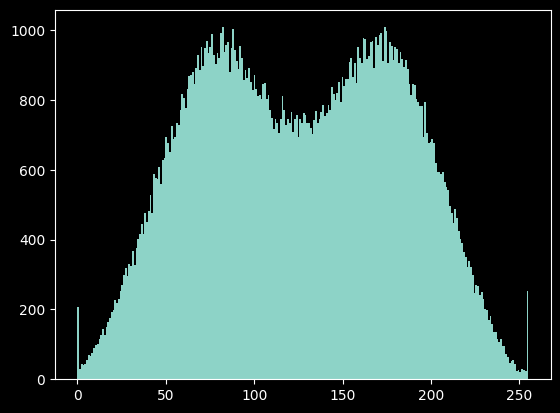

In [17]:
plt.hist(coins_noise.flatten(), bins=256)
plt.show()

In [18]:
bincount = np.bincount(coins_noise.flatten())

probabilities = bincount / np.sum(bincount)
transformed_prob = np.floor(np.cumsum((256-1) * probabilities)).astype(np.uint8)

transformed_image = transformed_prob[coins_noise]

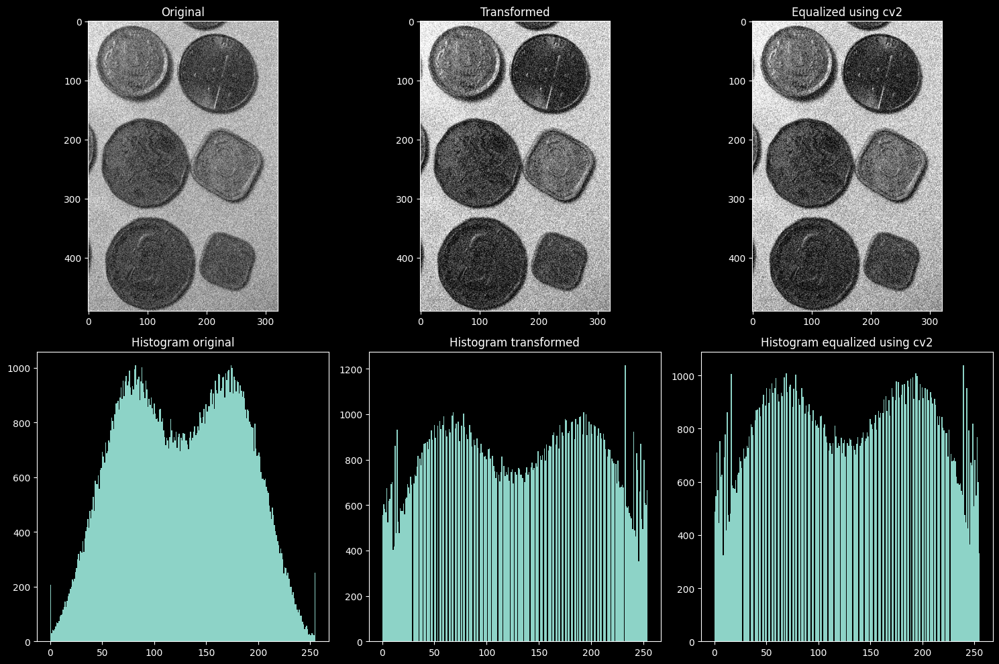

In [19]:
fig, axs = plt.subplots(2,3, figsize=(15, 10))
axs[0,0].imshow(coins_noise, cmap='gray')
axs[0,0].set_title('Original')
axs[1,0].hist(coins_noise.flatten(), bins=256)
axs[1,0].set_title('Histogram original')
axs[0,1].imshow(transformed_image, cmap='gray')
axs[0,1].set_title('Transformed')
axs[1,1].hist(transformed_image.flatten(), bins=256)
axs[1,1].set_title('Histogram transformed')
axs[0,2].imshow(cv2.equalizeHist(coins_noise), cmap='gray')
axs[0,2].set_title('Equalized using cv2')
axs[1,2].hist(cv2.equalizeHist(coins_noise).flatten(), bins=256)
axs[1,2].set_title('Histogram equalized using cv2')
plt.tight_layout()
plt.show()

---

##### Zad. 4: Transformacja do rozkładu docelowego

Dla obrazu `hare_gray` wykonaj transformację do wybranego (założonego przez siebie) rozkładu docelowego, tak aby zmaksymalizować możliwość wyodrębnienia obiektu z otoczenia (zająca) przy użyciu algorytmu binaryzacji Otsu. Zacznij od zastanowienia się nad doborem rozkładu docelowego (możesz zbadać zachowanie transformacji w zależności od wybranego rozkładu).

Podpowiedź: przedstawiona we wstępie teoretycznym transformacja obu rozkładów (źródłowego i docelowego) do rozkładu jednostajnego _nie musi_ zostać faktycznie wykonana (dlatego nie używaj w zadaniu funkcji `cv2.equalizeHist`)! Wystarczy porównywanie ze sobą wartości ze skumulowanych rozkładów (rysunek 3).

Podpowiedź 2: [cv2.LUT](https://docs.opencv.org/4.5.3/d2/de8/group__core__array.html#gab55b8d062b7f5587720ede032d34156f)

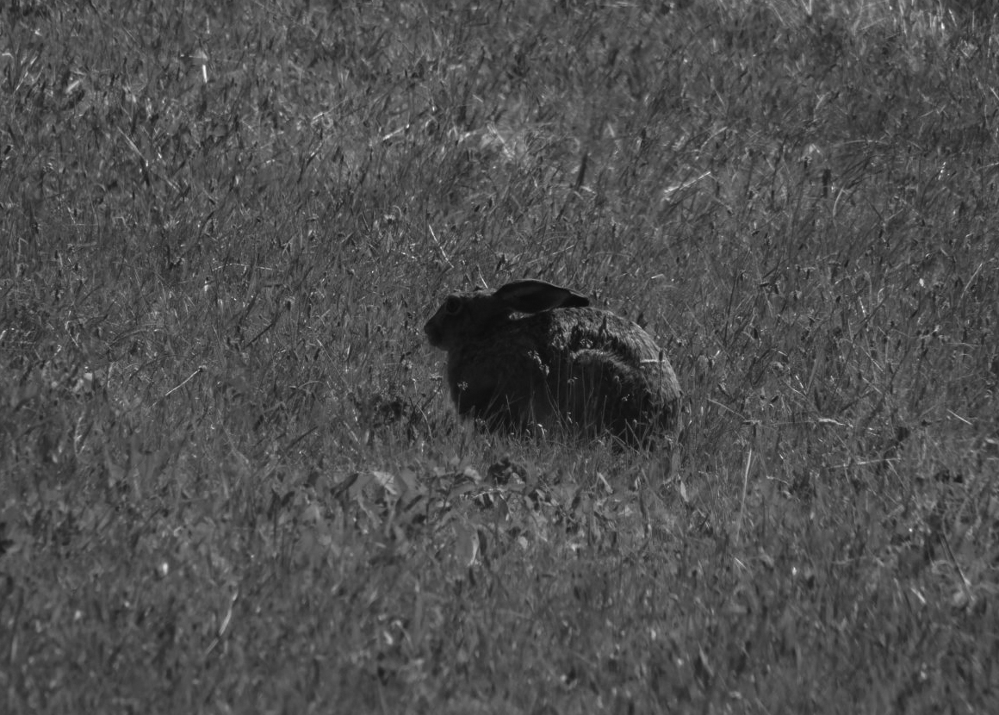

In [20]:
hare_gray = cv2.imread('Zajac.jpg', cv2.IMREAD_GRAYSCALE)
Image.fromarray(hare_gray)

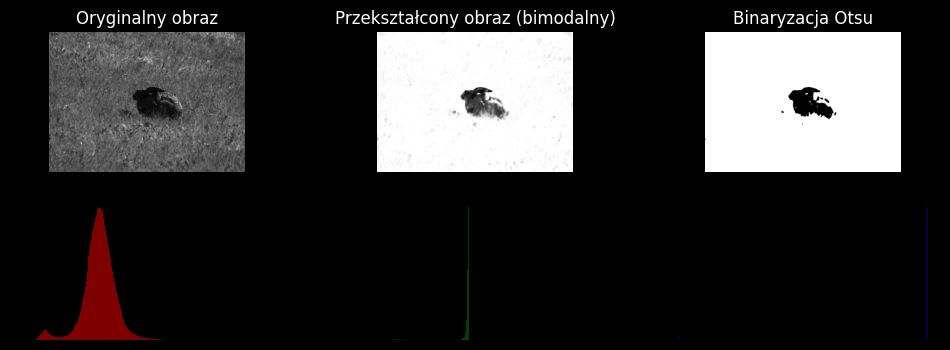

In [21]:
x = np.arange(256)
    
low_mean = 25
low_std = 20
low_distribution = norm.pdf(x, low_mean, low_std)

high_mean = 210
high_std = 20
high_distribution = norm.pdf(x, high_mean, high_std)

bimodal_distribution = low_distribution + high_distribution
bimodal_distribution /= bimodal_distribution.sum()
cdf_bimodal = np.cumsum(bimodal_distribution * 255)

cdf_bimodal = (cdf_bimodal ).astype('uint8')  # Skalowanie CDF do zakresu [0, 255]

LUT = cdf_bimodal

hare_median = cv2.medianBlur(hare_gray, 11)

hare_transformed = cv2.LUT(hare_median, LUT)
_, otsu_binary_image = cv2.threshold(hare_transformed, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

fig, ax = plt.subplots(2, 3, figsize=(12, 4))
ax = ax.flatten()

ax[0].imshow(cv2.medianBlur(hare_gray, 5), cmap='gray')
ax[0].set_title("Oryginalny obraz")

ax[1].imshow(hare_transformed, cmap='gray')
ax[1].set_title("Przekształcony obraz (bimodalny)")

ax[2].imshow(otsu_binary_image, cmap='gray')
ax[2].set_title("Binaryzacja Otsu")

ax[3].hist(cv2.medianBlur(hare_gray, 5).flatten(), bins=256, range=(0, 256), density=True, color='r', alpha=0.5)
ax[4].hist(hare_transformed.flatten(), bins=256, range=(0, 256), density=True, color='g', alpha=0.5)
ax[5].hist(otsu_binary_image.flatten(), bins=256, range=(0, 256), density=True, color='b', alpha=0.5)

for a in ax:
    a.axis('off')

plt.show()

In [27]:
def calculate_cdf(hist):
    cdf = hist.cumsum()
    cdf_normalized = cdf / cdf[-1] 
    # cdf_normalized = cdf_normalized.astype(np.uint8)
    return cdf_normalized

def histogram_matching_bimodal(source, target_cdf):
    source_hist, bins = np.histogram(source.flatten(), 256, [0, 256])
    source_cdf = calculate_cdf(source_hist)

    lookup_table = np.zeros(256, dtype=np.uint8)
    for src_pixel_val in range(256):
        closest_match = np.abs(target_cdf - source_cdf[src_pixel_val]).argmin()
        lookup_table[src_pixel_val] = closest_match

    matched = cv2.LUT(source, lookup_table)

    return matched

def generate_bimodal_distribution(mu1, sigma1, mu2, sigma2, size=256):
    x = np.arange(0, size)
    
    gauss1 = norm.pdf(x, mu1, sigma1)
    gauss2 = norm.pdf(x, mu2, sigma2)
    
    bimodal_distribution = gauss1 + gauss2
    bimodal_distribution /= bimodal_distribution.sum()
    
    return bimodal_distribution

In [28]:
mu1, sigma1 = 40, 20
mu2, sigma2 = 210, 50

bimodal_distribution = generate_bimodal_distribution(mu1, sigma1, mu2, sigma2, size=hare_median.shape[0]*hare_median.shape[1])

target_cdf = calculate_cdf(bimodal_distribution)

source_image = hare_median
matched_image = histogram_matching_bimodal(source_image, target_cdf)

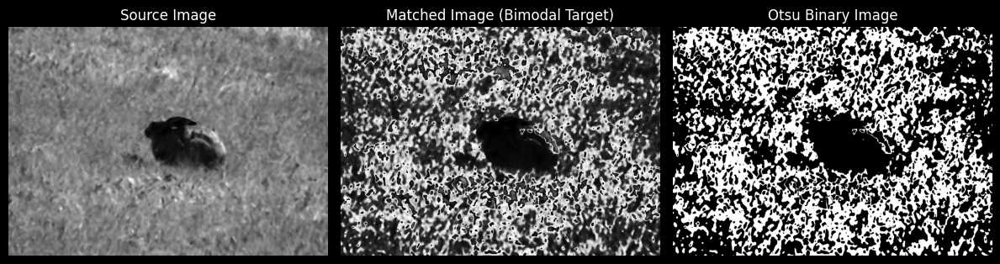

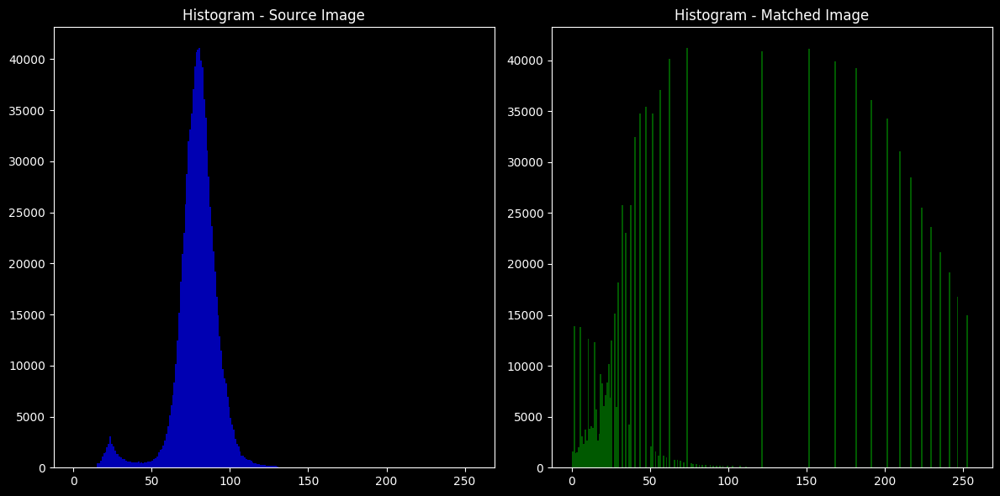

In [29]:
plt.figure(figsize=(12, 8))
plt.subplot(1, 3, 1)
plt.title('Source Image')
plt.imshow(source_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Matched Image (Bimodal Target)')
plt.imshow(matched_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Otsu Binary Image')
_, threshed = cv2.threshold(matched_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
plt.imshow(threshed, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title('Histogram - Source Image')
plt.hist(source_image.flatten(), bins=256, range=[0, 256], color='blue', alpha=0.7)

plt.subplot(1, 2, 2)
plt.title('Histogram - Matched Image')
plt.hist(matched_image.flatten(), bins=256, range=[0, 256], color='green', alpha=0.7)

plt.tight_layout()
plt.show()

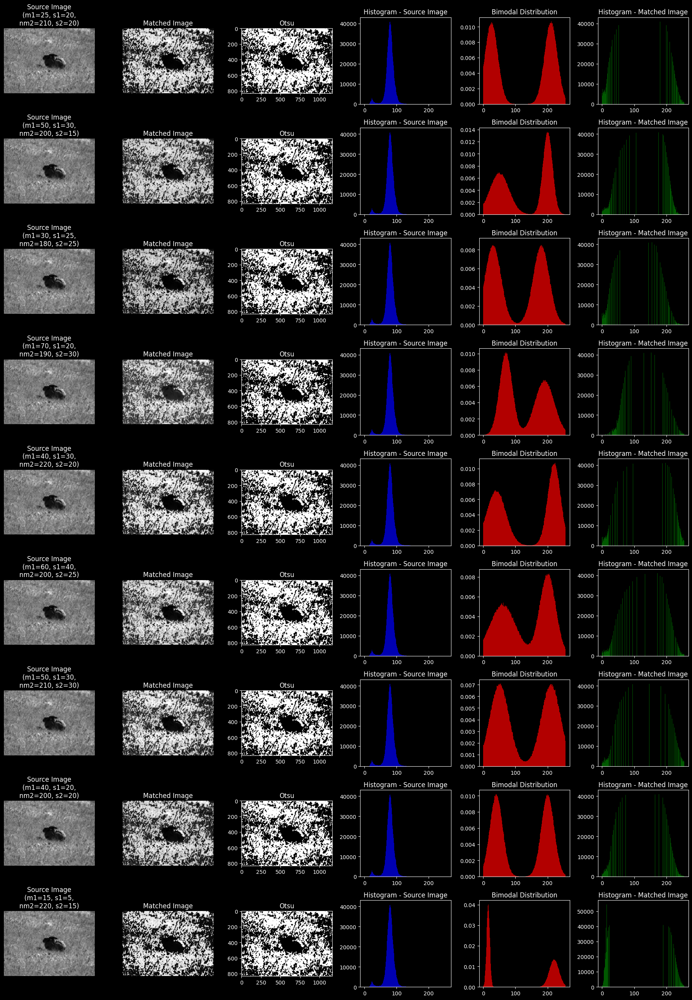

In [44]:
def test_bimodal_histogram_matching(source_image, params_list):
    fig, axs = plt.subplots(len(params_list), 6, figsize=(18, 26))

    for idx, (mu1, sigma1, mu2, sigma2) in enumerate(params_list):

        bimodal_distribution = generate_bimodal_distribution(mu1, sigma1, mu2, sigma2)

    
        target_cdf = calculate_cdf(bimodal_distribution)

        # print(target_cdf.shape)

        matched_image = histogram_matching_bimodal(source_image, target_cdf)

        # print(matched_image.shape)

        axs[idx, 0].imshow(source_image, cmap='gray')
        axs[idx, 0].set_title(f'Source Image\n(m1={mu1}, s1={sigma1},\nnm2={mu2}, s2={sigma2})')
        axs[idx, 0].axis('off')

        axs[idx, 1].imshow(matched_image, cmap='gray')
        axs[idx, 1].set_title(f'Matched Image')
        axs[idx, 1].axis('off')

        _, threshed = cv2.threshold(matched_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        axs[idx, 2].imshow(threshed, cmap='gray')
        axs[idx, 2].set_title('Otsu')

        axs[idx, 3].hist(source_image.flatten(), bins=256, range=[0, 256], color='blue', alpha=0.7)
        axs[idx, 3].set_title('Histogram - Source Image')

        bimodal_values = np.random.choice(np.arange(256), p=bimodal_distribution, size=source_image.size)
        axs[idx, 4].hist(bimodal_values, bins=256, range=[0, 256], color='red', alpha=0.7, density=True)
        axs[idx, 4].set_title('Bimodal Distribution')

        axs[idx, 5].hist(matched_image.flatten(), bins=256, range=[0, 256], color='green', alpha=0.7)
        axs[idx, 5].set_title('Histogram - Matched Image')


    plt.tight_layout()
    plt.show()

params_list = [
    (25, 20, 210, 20),
    (50, 30, 200, 15),
    (30, 25, 180, 25),
    (70, 20, 190, 30),
    (40, 30, 220, 20),
    (60, 40, 200, 25),
    (50, 30, 210, 30),
    (40, 20, 200, 20),
    (15, 5, 220, 15)
]


test_bimodal_histogram_matching(source_image, params_list)
